## Final Project Submission

Please fill out:
* Student name: Jelena Sinclair
* Student pace: full time
* Scheduled project review date/time: 24 Oct 2023
* Instructor name: Rajive Islam
* Blog post URL:


####  EDA

In [1]:
# Importing libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import style
style.use('ggplot')
%matplotlib inline
import statsmodels.api as sm
from statsmodels.formula.api import ols

In [2]:
# Importing data
df = pd.read_csv('data\kc_house_data.csv')

In [3]:
#Dropping the id and view columns. Not relevant for the business problem
# id arbitrary number, view is just how many times the house was viewed
df.drop(columns=['id','view'], inplace=True)


In [4]:
# check data types
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 19 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   date           21597 non-null  object 
 1   price          21597 non-null  float64
 2   bedrooms       21597 non-null  int64  
 3   bathrooms      21597 non-null  float64
 4   sqft_living    21597 non-null  int64  
 5   sqft_lot       21597 non-null  int64  
 6   floors         21597 non-null  float64
 7   waterfront     19221 non-null  float64
 8   condition      21597 non-null  int64  
 9   grade          21597 non-null  int64  
 10  sqft_above     21597 non-null  int64  
 11  sqft_basement  21597 non-null  object 
 12  yr_built       21597 non-null  int64  
 13  yr_renovated   17755 non-null  float64
 14  zipcode        21597 non-null  int64  
 15  lat            21597 non-null  float64
 16  long           21597 non-null  float64
 17  sqft_living15  21597 non-null  int64  
 18  sqft_l

In [5]:
# summary stats of variables
df.describe()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,condition,grade,sqft_above,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.159700e+04,21597.000000,21597.000000,21597.000000,2.159700e+04,21597.000000,19221.000000,21597.000000,21597.000000,21597.000000,21597.000000,17755.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000
mean,5.402966e+05,3.373200,2.115826,2080.321850,1.509941e+04,1.494096,0.007596,3.409825,7.657915,1788.596842,1970.999676,83.636778,98077.951845,47.560093,-122.213982,1986.620318,12758.283512
std,3.673681e+05,0.926299,0.768984,918.106125,4.141264e+04,0.539683,0.086825,0.650546,1.173200,827.759761,29.375234,399.946414,53.513072,0.138552,0.140724,685.230472,27274.441950
min,7.800000e+04,1.000000,0.500000,370.000000,5.200000e+02,1.000000,0.000000,1.000000,3.000000,370.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,3.220000e+05,3.000000,1.750000,1430.000000,5.040000e+03,1.000000,0.000000,3.000000,7.000000,1190.000000,1951.000000,0.000000,98033.000000,47.471100,-122.328000,1490.000000,5100.000000
50%,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,3.000000,7.000000,1560.000000,1975.000000,0.000000,98065.000000,47.571800,-122.231000,1840.000000,7620.000000
75%,6.450000e+05,4.000000,2.500000,2550.000000,1.068500e+04,2.000000,0.000000,4.000000,8.000000,2210.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000
max,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,5.000000,13.000000,9410.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


In [6]:
# how many values are not a number (NaN)?
nan_count = df.isna().sum()/len(df)*100
nan_count

date              0.000000
price             0.000000
bedrooms          0.000000
bathrooms         0.000000
sqft_living       0.000000
sqft_lot          0.000000
floors            0.000000
waterfront       11.001528
condition         0.000000
grade             0.000000
sqft_above        0.000000
sqft_basement     0.000000
yr_built          0.000000
yr_renovated     17.789508
zipcode           0.000000
lat               0.000000
long              0.000000
sqft_living15     0.000000
sqft_lot15        0.000000
dtype: float64

In [7]:
# statsmodels.formula.api OLS algorithm automatically excludes rows with NaN
# work out how much data will be lost

# get total number of rows that have at least one nan
tot_nan_rows = df.isna().any(axis=1).sum()
data_lost = tot_nan_rows/len(df['price'])*100
data_lost

# still have thousands of rows of data, so 27% data being removed seems acceptable

26.80001852109089

In [8]:
# Creating a year column
df['year_sold'] = df['date'].str[-4:].astype(int)

# Creating a column 'house_age' - difference btwn year of sale and year built 
df['house_age'] = df['year_sold'] - df['yr_built']

# removed date, as will not need it for analysis. Already extracted year for age calculations
df = df.drop('date',axis=1)
df = df.drop(['year_sold'], axis = 1)

In [9]:
# sqft_basement has '?' in it, which are missing data
# BUT sqft_basement = sqft_living - sqft-above
# proof
df['sqft_basement_recalc'] = df['sqft_living']-df['sqft_above']
df[['sqft_living','sqft_above','sqft_basement','sqft_basement_recalc']].head(10)

# sqft_basement = recalculated, except when ?, so use instead

,sqft_living,sqft_above,sqft_basement,sqft_basement_recalc
0,1180,1180,0.0,0
1,2570,2170,400.0,400
2,770,770,0.0,0
3,1960,1050,910.0,910
4,1680,1680,0.0,0
5,5420,3890,1530.0,1530
6,1715,1715,?,0
7,1060,1060,0.0,0
8,1780,1050,730.0,730
9,1890,1890,0.0,0


In [10]:
# basement size still has 0's, which makes for a weird distribution
# replace with categorical of basement/no basement based on basement size
# Convert 'sqft_basement' to a categorical variable
df['has_basement'] = np.where(df['sqft_basement_recalc'] == 0, 0, 1)

df = df.drop(['sqft_basement'], axis = 1)
df = df.drop(['sqft_basement_recalc'], axis = 1)


In [11]:
# Convert 'yr_renovated' to a categorical variable of renovated or not - leave missing data (NaN) as is
df['renovated'] = np.where(df['yr_renovated'] == 0, 0, np.where(df['yr_renovated'].notna(), 1, np.nan))

# drop yr_renovated
df = df.drop(['yr_renovated'], axis = 1)


In [12]:
# moving 'price' to first column for ease of coding
df.insert(0,'price', df.pop('price'))

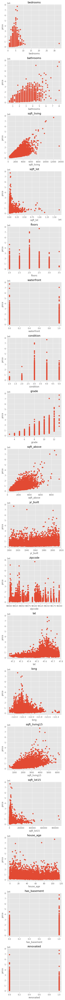

In [13]:
fig, axs = plt.subplots(len(df.columns)-1,figsize=(5,75))

hvar = list(df.columns)

for col in range(0,len(df.columns)-1):
    
    axs[col].scatter(df.iloc[:,col+1],df['price'])

    ax = axs[col];
    ax.set_title(hvar[col+1])
    ax.set_xlabel(hvar[col+1])
    ax.set_ylabel('price')
    
plt.tight_layout()

In [14]:
# remove obvious outlier of 33 beds (checked listing an and error should be three bedrooms, arguably could correct instead of remove)
df = df[df['bedrooms'] < 15]


In [16]:
# drop list
# yr_built - have made house age, which accounts for year sold (i.e. looking at age of house at time sold, not year built)
# zipcode - for simplicity, but also zip would be a messy categorical (large number of options), zip is somewhat an arbitrary number, and already covered by long & lat

df = df.drop(['yr_built'], axis = 1)
df = df.drop(['zipcode'], axis = 1)


C:\Users\sinclain\AppData\Local\anaconda3\envs\learn-env\lib\site-packages\numpy\lib\histograms.py:403: RuntimeWarning: invalid value encountered in greater_equal
  keep = (a >= first_edge)
C:\Users\sinclain\AppData\Local\anaconda3\envs\learn-env\lib\site-packages\numpy\lib\histograms.py:404: RuntimeWarning: invalid value encountered in less_equal
  keep &= (a <= last_edge)
C:\Users\sinclain\AppData\Local\anaconda3\envs\learn-env\lib\site-packages\numpy\lib\histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
C:\Users\sinclain\AppData\Local\anaconda3\envs\learn-env\lib\site-packages\numpy\lib\histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


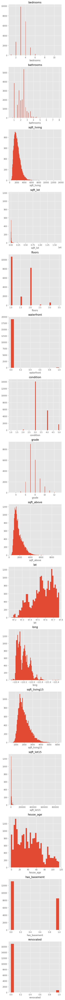

In [17]:
# look at distributions of variables
fig, axs = plt.subplots(len(df.columns)-1,figsize=(5,75))

hvar = list(df.columns)

for col in range(0,len(df.columns)-1):
    
    axs[col].hist(df.iloc[:,col+1], bins='auto')

    ax = axs[col];
    ax.set_title(hvar[col+1])
    ax.set_xlabel(hvar[col+1])
    #ax.set_ylabel('price')
    
plt.tight_layout()


In [18]:
# bedrooms looks categorical on scatter plot
# condense making everything above to 5 (i.e. 5 means 5+ category)
df.loc[df['bedrooms'] > 5, 'bedrooms'] = 5

# bathrooms looks categorical on scatter plot
# many subvalues for bathrooms (e.g. 0.25, 0.5, 0.75). For simplicity, round values and group 5+
df['bathrooms'] = df['bathrooms']+0.01       # add a tiny number because python rounding is really stupid
df['bathrooms'] = df['bathrooms'].round()
df.loc[df['bathrooms'] > 5, 'bathrooms'] = 5


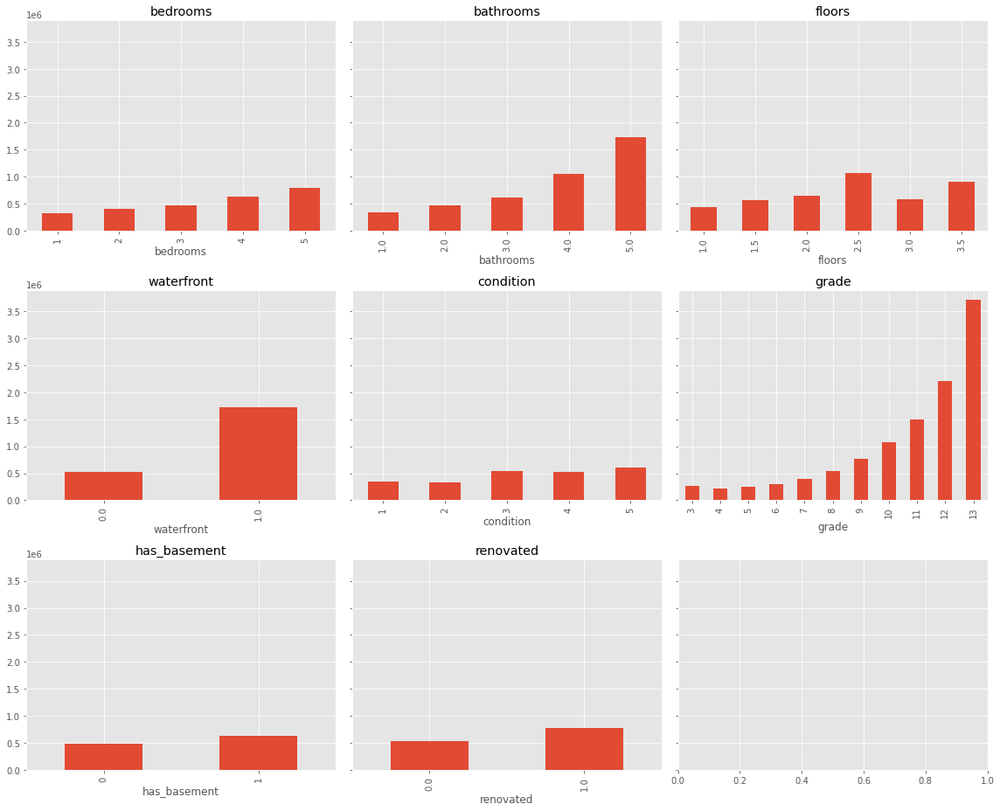

In [22]:
# Plot Categorical Variables

fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(16,13), sharey=True)

categoricals = ['bedrooms','bathrooms','floors','waterfront','condition', 'grade','has_basement', 'renovated']

for col, ax in zip(categoricals, axes.flatten()):
    (df.groupby(col)               # group values together by column of interest
         .mean()['price']            # take the mean of the price for each group
         #.sort_values()              # sort the groups in ascending order
         .plot
         .bar(ax=ax))                # create a bar graph on the ax
    
    ax.set_title(col)                # Make the title the name of the column
    
fig.tight_layout()

In [23]:
# Create dummy variables for your 4 categorical features
# OLS algorithm does one-hot encoding from str so just need to make them str

df['bedrooms'] = df['bedrooms'].astype(str)
df['bathrooms'] = df['bathrooms'].astype(str)
df['floors'] = df['floors'].astype(str)
df['condition'] = df['condition'].astype(str)
df['grade'] = df['grade'].astype(str)
df['waterfront'] = df['waterfront'].astype(str)
df['has_basement'] = df['has_basement'].astype(str)
df['renovated'] = df['renovated'].astype(str)

#### Iteration 1 - Baseline model

In [24]:
# calculate baseline model
outcome = 'price'
predictors = df.drop('price',axis=1)
pred_sum = '+'.join(predictors.columns)
formula = outcome + '~' + pred_sum

In [25]:
model = ols(formula=formula,data=df).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.726
Model:                            OLS   Adj. R-squared:                  0.725
Method:                 Least Squares   F-statistic:                     1099.
Date:                Sat, 23 Sep 2023   Prob (F-statistic):               0.00
Time:                        17:47:48   Log-Likelihood:            -2.1505e+05
No. Observations:               15808   AIC:                         4.302e+05
Df Residuals:                   15769   BIC:                         4.305e+05
Df Model:                          38                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept         -4.034e+07   1.79e+06    -22.522      0.000   -4.39e+07   -3.68e+07
bedrooms[T.2]      1.831e+04   1.77e+04      1.036      0.300   -1.63e+04    5.29e+04
bedrooms[T.3]     -6473.5765   1.77e+04     -0.366      0.714   -4.11e+04    2.82e+04
bedrooms[T.4]     -4.133e+04    1.8e+04     -2.291      0.022   -7.67e+04   -5970.521
bedrooms[T.5]      -4.71e+04   1.89e+04     -2.498      0.013   -8.41e+04   -1.01e+04
bathrooms[T.2.0]   2572.8519   5614.228      0.458      0.647   -8431.678    1.36e+04
bathrooms[T.3.0]    745.9526   7250.177      0.103      0.918   -1.35e+04     1.5e+04
bathrooms[T.4.0]   7.241e+04   1.12e+04      6.478      0.000    5.05e+04    9.43e+04
bathrooms[T.5.0]   3.086e+05   2.06e+04     14.962      0.000    2.68e+05    3.49e+05
floors[T.1.5]      1.281e+04   6292.324      2.037      0.042     481.088    2.51e+04
floors[T.2.0]       2.24e+04   5092.793      4.398      0.000    1.24e+04    3.24e+04
floors[T.2.5]      1.279e+05   1.88e+04      6.787      0.000    9.09e+04    1.65e+05
floors[T.3.0]      7.176e+04    1.1e+04      6.509      0.000    5.01e+04    9.34e+04
floors[T.3.5]      1.678e+05   8.04e+04      2.087      0.037    1.02e+04    3.25e+05
waterfront[T.1.0]  7.437e+05   1.83e+04     40.597      0.000    7.08e+05     7.8e+05
condition[T.2]     2.813e+04   4.83e+04      0.582      0.560   -6.65e+04    1.23e+05
condition[T.3]      3.56e+04   4.54e+04      0.784      0.433   -5.34e+04    1.25e+05
condition[T.4]     7.721e+04   4.54e+04      1.700      0.089   -1.18e+04    1.66e+05
condition[T.5]     1.219e+05   4.56e+04      2.671      0.008    3.25e+04    2.11e+05
grade[T.11]        1.872e+05   1.38e+04     13.550      0.000     1.6e+05    2.14e+05
grade[T.12]        7.153e+05   2.61e+04     27.429      0.000    6.64e+05    7.66e+05
grade[T.13]        1.721e+06   6.13e+04     28.050      0.000     1.6e+06    1.84e+06
grade[T.3]        -2.195e+05   1.97e+05     -1.112      0.266   -6.06e+05    1.67e+05
grade[T.4]        -3.846e+05   5.14e+04     -7.476      0.000   -4.85e+05   -2.84e+05
grade[T.5]         -4.12e+05   1.93e+04    -21.362      0.000    -4.5e+05   -3.74e+05
grade[T.6]        -3.998e+05   1.19e+04    -33.560      0.000   -4.23e+05   -3.76e+05
grade[T.7]        -3.466e+05   9778.072    -35.442      0.000   -3.66e+05   -3.27e+05
grade[T.8]        -2.737e+05   8832.051    -30.986      0.000   -2.91e+05   -2.56e+05
grade[T.9]        -1.534e+05   8500.250    -18.051      0.000    -1.7e+05   -1.37e+05
has_basement[T.1]  9452.9697   6063.760      1.559      0.119   -2432.694    2.13e+04
renovated[T.1.0]   7.921e+04   8452.742      9.370      0.000    6.26e+04    9.58e+04
sqft_living         151.5666      7.033     21.549      0.000     137.780     165.353
sqft_lot              0.1228      0.054      2.267      0.023       0.017

- An R-squared of 0.726 means that approximately 72.6% of the variability in the dependent variable is explained by the independent variables
- Adj. R-squared is 0.725, which is very close to the R-squared, indicating that the additional predictors in the model are providing meaningful information.
- A high F-statistic of 1099 indicates that at least one of the independent variables is statistically significant in explaining the variation in the dependent variable. The low p-value (0.00) associated with the F-statistic suggests that the model as a whole is statistically significant in predicting housing prices.

- Coefficients and p-values have been assessed and the ones with p-value above 0.05 were deemed statistically insignificant.
- The Durbin-Watson statistic is approximately 1.978, which is close to 2. This suggests that there is relatively little evidence of autocorrelation in the residuals.
- Omnibus statistic is 10248.793, and the associated probability (Prob(Omnibus)) is 0.000. This indicates that the residuals do not follow a normal distribution, and there is evidence of departure from normality. The significant p-value suggests that the residuals are not normally distributed.
- Jarque-Bera (JB) statistic is 517885.629, and the associated probability (Prob(JB)) is 0.00. This indicates that the residuals significantly depart from a normal distribution. The extremely low p-value suggests non-normality of residuals.
- The skew is 2.479, indicating a positive skew.
- The kurtosis is 30.598, indicating heavy tails.
- the condition number is 5.90e+07, which is a very large value. This suggests the potential presence of multicollinearity among the predictor variables, and the smallest eigenvalue is 1.55e-18 means the design matrix is nearly singular. 

Violations of normality assumptions and the presence of multicollinearity can affect the reliability of coefficient estimates and statistical tests. The model needs to be improved. 

#### Checking multicollinearity

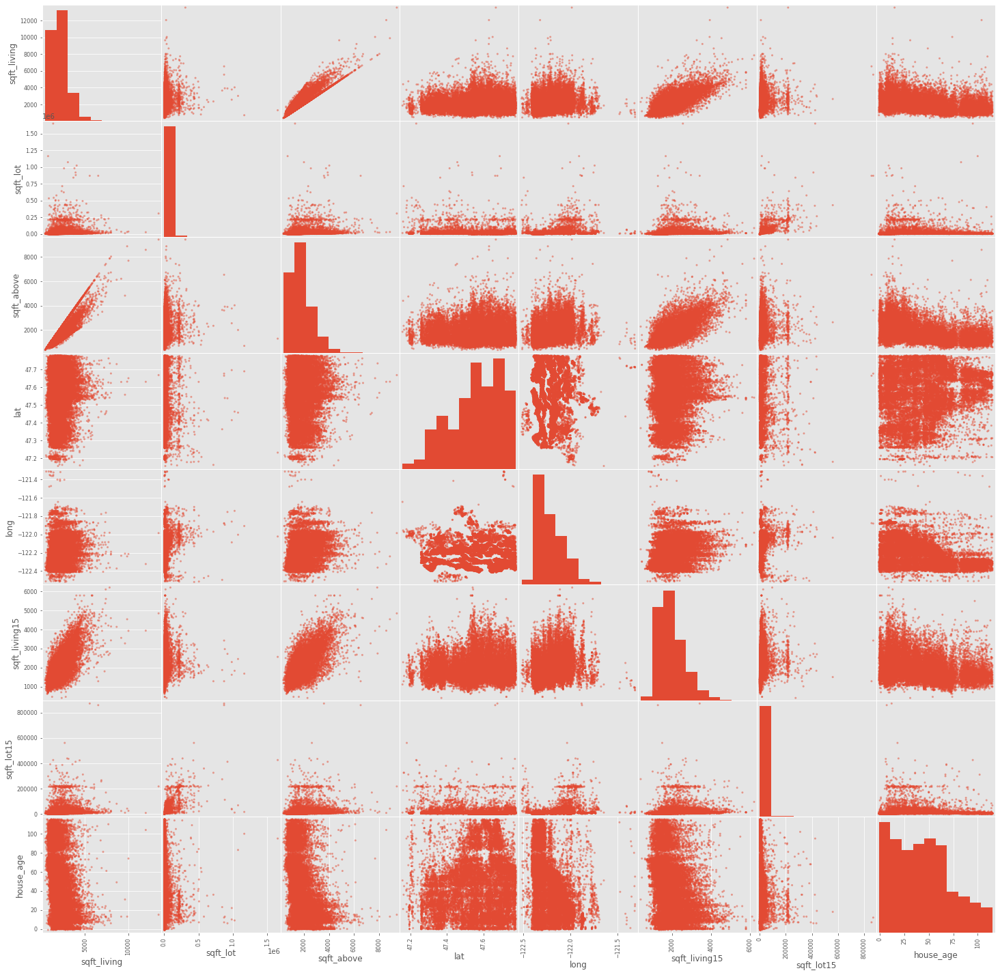

In [26]:
# plot matrix of scatter plots between each varaible
pd.plotting.scatter_matrix(df.iloc[:,1:], figsize=(25,25));

In [27]:
# some variables appear to be linearly correlated
# calculate correlation coefficients
df.iloc[:,1:].corr()

,sqft_living,sqft_lot,sqft_above,lat,long,sqft_living15,sqft_lot15,house_age
sqft_living,1.000000,0.173449,0.876448,0.052178,0.241200,0.756400,0.184337,-0.318580
sqft_lot,0.173449,1.000000,0.184134,-0.085507,0.230222,0.144756,0.718203,-0.052846
sqft_above,0.876448,0.184134,1.000000,-0.001160,0.344819,0.731756,0.195069,-0.424367
lat,0.052178,-0.085507,-0.001160,1.000000,-0.135340,0.048721,-0.086129,0.147869
long,0.241200,0.230222,0.344819,-0.135340,1.000000,0.335601,0.255579,-0.409941
sqft_living15,0.756400,0.144756,0.731756,0.048721,0.335601,1.000000,0.183506,-0.326673
sqft_lot15,0.184337,0.718203,0.195069,-0.086129,0.255579,0.183506,1.000000,-0.070760
house_age,-0.318580,-0.052846,-0.424367,0.147869,-0.409941,-0.326673,-0.070760,1.000000


In [29]:
# use stack to create list of highly correlated pairs
df_cor = df.iloc[:,1:].corr().abs().stack().reset_index().sort_values(0, ascending=False)

# zip the variable name columns (Which were only named level_0 and level_1 by default) in a new column named "pairs"
df_cor['pairs'] = list(zip(df_cor.level_0, df_cor.level_1))

# set index to pairs
df_cor.set_index(['pairs'], inplace = True)

# drop level columns
df_cor.drop(columns=['level_1', 'level_0'], inplace = True)

# rename correlation column as cc rather than 0
df_cor.columns = ['cc']

# drop duplicates. This could be dangerous if you have variables perfectly correlated with variables other than themselves.
# for the sake of exercise, kept it in.
df_cor.drop_duplicates(inplace=True)

# get list of pairs with correlation coefficient >0.5
df_cor[(df_cor.cc>.5) & (df_cor.cc <1)]


,cc
pairs,
"(sqft_living, sqft_above)",0.876448
"(sqft_living, sqft_living15)",0.756400
"(sqft_above, sqft_living15)",0.731756
"(sqft_lot, sqft_lot15)",0.718203


In [31]:
# from model results:
# bedrooms not signficiant - drop
# bathrooms 2/3 not significant - deal with later
# condition 3 out of 4 not significant - drop condition
# has_basement not significant - drop
# sqft_above not significant - drop

# from correlation choose between:
# sqft_living vs sqft_above - sqft_above already dropped
# sqft_living vs sqft_living15 - drop sqft_living15 as less relevant (domain knowledge)
# sqft_above vs sqft_living15 - both already dropped
# sqft_lor vs sqft_lot15 - corr 0.718 - arguably could keep, but for simplicity drop sqft_lot15 as less relevant

df.drop(columns=['bedrooms','condition','has_basement','sqft_above','sqft_living15','sqft_lot15'], inplace=True)

In [37]:
# deal with bathrooms being partially significant - group <3
df['bathrooms'] = df['bathrooms'].astype(float)
df.loc[df['bathrooms'] < 3, 'bathrooms'] = 3
df['bathrooms'] = df['bathrooms'].astype(str)


#### Iteration 2

In [38]:
outcome = 'price'
predictors = df.drop('price',axis=1)
pred_sum = '+'.join(predictors.columns)
formula = outcome + '~' + pred_sum

model = ols(formula=formula,data=df).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.717
Model:                            OLS   Adj. R-squared:                  0.717
Method:                 Least Squares   F-statistic:                     1668.
Date:                Sat, 23 Sep 2023   Prob (F-statistic):               0.00
Time:                        18:08:22   Log-Likelihood:            -2.1529e+05
No. Observations:               15808   AIC:                         4.306e+05
Df Residuals:                   15783   BIC:                         4.308e+05
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept         -3.699e+07    1.7e+06    -21.739      0.000   -4.03e+07   -3.37e+07
bathrooms[T.4.0]   6.529e+04   8142.085      8.018      0.000    4.93e+04    8.12e+04
bathrooms[T.5.0]   2.878e+05   1.88e+04     15.326      0.000    2.51e+05    3.25e+05
floors[T.1.5]     -4401.7534   6163.367     -0.714      0.475   -1.65e+04    7679.149
floors[T.2.0]      8417.1691   4369.887      1.926      0.054    -148.308     1.7e+04
floors[T.2.5]       1.05e+05   1.88e+04      5.581      0.000    6.81e+04    1.42e+05
floors[T.3.0]      5.498e+04   1.08e+04      5.084      0.000    3.38e+04    7.62e+04
floors[T.3.5]      1.588e+05   8.15e+04      1.950      0.051    -860.034    3.19e+05
waterfront[T.1.0]  7.705e+05   1.85e+04     41.649      0.000    7.34e+05    8.07e+05
grade[T.11]        2.013e+05   1.39e+04     14.497      0.000    1.74e+05    2.29e+05
grade[T.12]        7.409e+05   2.62e+04     28.288      0.000     6.9e+05    7.92e+05
grade[T.13]        1.745e+06   6.19e+04     28.208      0.000    1.62e+06    1.87e+06
grade[T.3]        -2.276e+05   1.99e+05     -1.141      0.254   -6.19e+05    1.63e+05
grade[T.4]        -4.354e+05    5.1e+04     -8.532      0.000   -5.35e+05   -3.35e+05
grade[T.5]        -4.615e+05   1.88e+04    -24.508      0.000   -4.98e+05   -4.25e+05
grade[T.6]        -4.478e+05   1.14e+04    -39.408      0.000    -4.7e+05   -4.26e+05
grade[T.7]        -3.859e+05   9212.645    -41.890      0.000   -4.04e+05   -3.68e+05
grade[T.8]        -2.998e+05   8470.026    -35.400      0.000   -3.16e+05   -2.83e+05
grade[T.9]        -1.669e+05   8500.035    -19.634      0.000   -1.84e+05    -1.5e+05
renovated[T.1.0]   5.407e+04   8372.902      6.458      0.000    3.77e+04    7.05e+04
sqft_living         155.0655      2.976     52.110      0.000     149.233     160.898
sqft_lot             -0.0466      0.040     -1.178      0.239      -0.124       0.031
lat                5.539e+05    1.2e+04     46.001      0.000     5.3e+05    5.77e+05
long              -9.045e+04   1.32e+04     -6.830      0.000   -1.16e+05   -6.45e+04
house_age          2311.3012     84.267     27.428      0.000    2146.129    2476.473
==============================================================================
Omnibus:                    10052.411   Durbin-Watson:                   1.976
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           467959.559
Skew:                           2.432   Prob(JB):                         0.00
Kurtosis:                      29.207   Cond. No.                     4.80e+07
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 4.8e+07. This might indicate that there are
strong multicollineari

- R-squared is 0.717 - approximately 71.7% of the variability in the price can be explained by the independent variables
- Adjusted R-squared is 0.717 similar to R-squared 
- A high F-statistic of 1668 suggests that at least one of the independent variables is statistically significant in explaining the variation in house price.
- F-statistic is very high (1540), and the Prob (F-statistic) is very close to 0 - the model is statistically significant.
- P-values are mostly < 0.05
- Omnibus statistic is quite high at 10052.411 indicating that the residuals significantly deviate from normality.
- JB statistic is very high, suggesting residuals are not normally distributed, indicates non-normality.
- A positive skew, suggesting residuals are skewed to the right, there may be more extreme positive values than negative ones.
- A high kurtosis indicates heavy tails or outliers in the distribution of residuals.
- The Durbin-Watson test suggests that there is little to no autocorrelation in the residuals.
- Cond. No. 4.80e+07 may indicate multicollinearity

The regression model appears to be statistically significant, as indicated by the low p-value of the F-statistic. The R-squared value suggests that the model explains a significant portion of the variance in the house price. However, the statistics related to the distribution of residuals (Omnibus, Jarque-Bera, Skew, Kurtosis) suggest that the residuals do not follow a normal distribution and may have some skewness and heavy tails. The Durbin-Watson statistic indicates that there is little autocorrelation in the residuals, which is a positive aspect of the model. The high condition number suggests the presence of multicollinearity among the independent variables, which could impact the stability and interpretability of the model coefficients. Further analysis and potential model adjustments may be needed to address these issues with the residuals and multicollinearity.

#### Visualize error terms


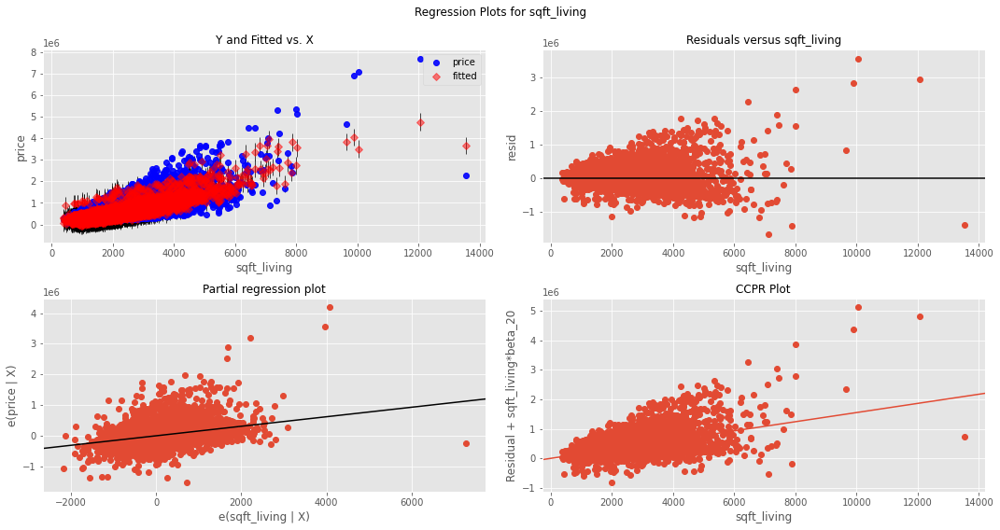

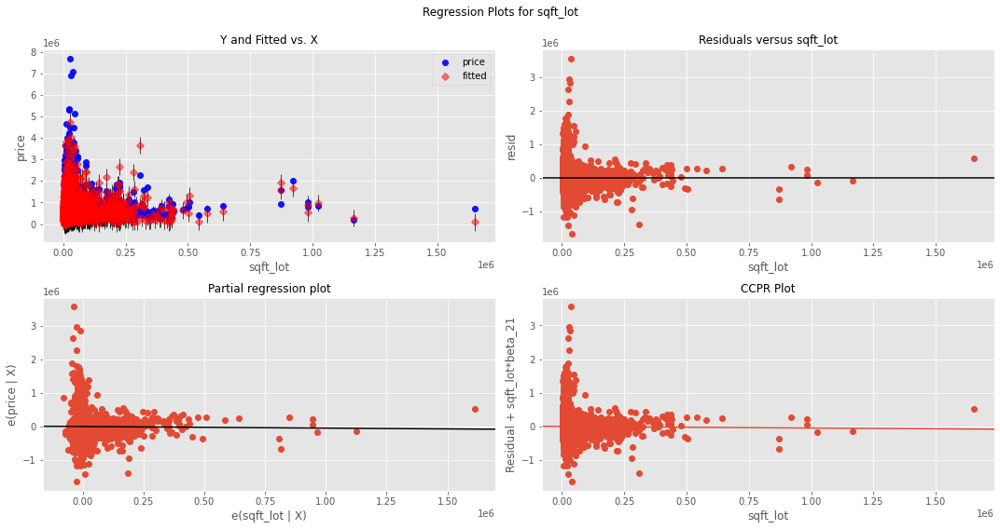

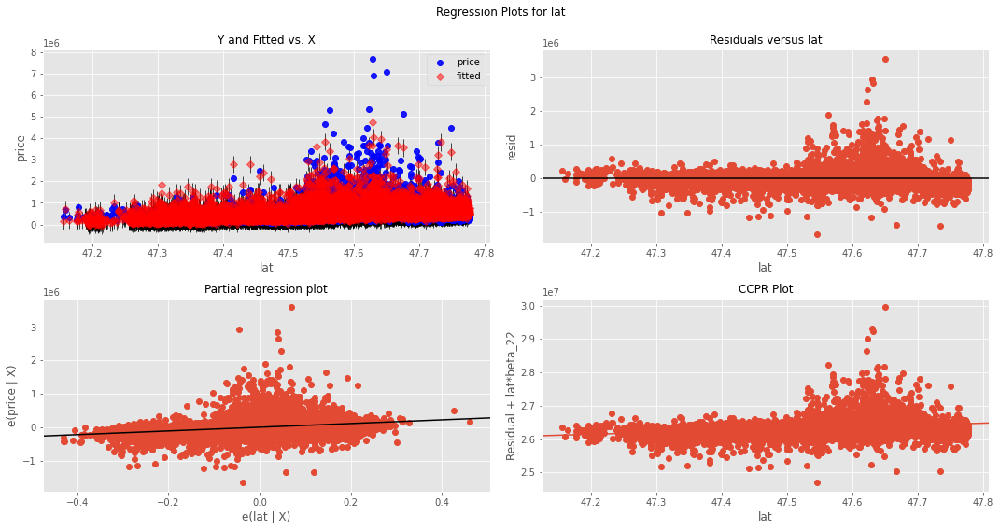

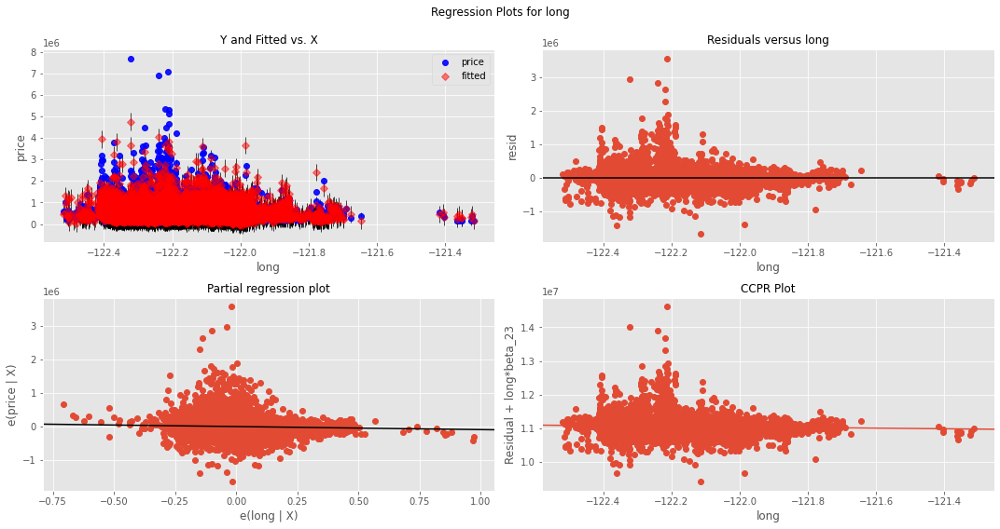

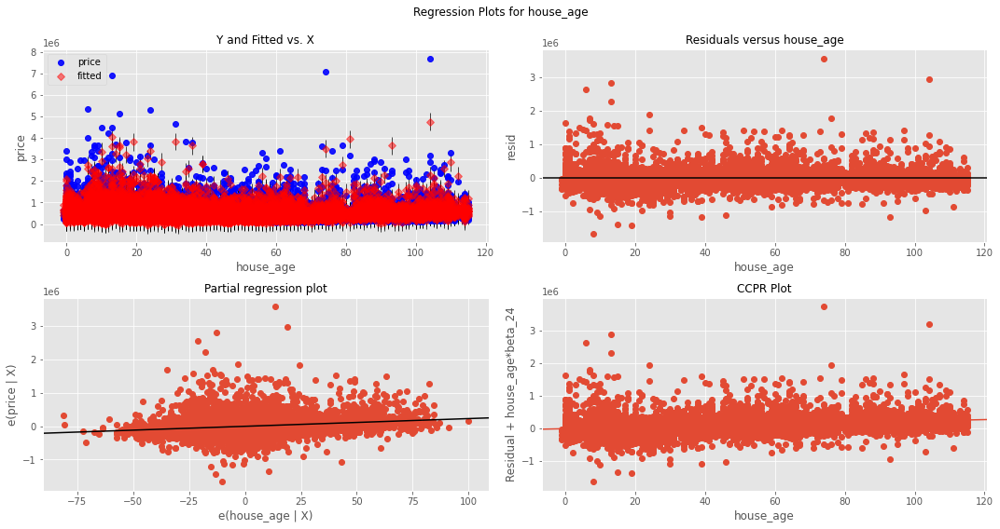

In [39]:
# List of predictor variables for which you want to create diagnostic plots
predictor_variables = ["sqft_living", "sqft_lot","lat", "long", "house_age"]

# Create a loop to generate diagnostic plots for each predictor
for predictor in predictor_variables:
    try:
        fig = plt.figure(figsize=(15, 8))
        fig = sm.graphics.plot_regress_exog(model, predictor, fig=fig)
        plt.show()
    except ValueError:
        print(f"'{predictor}' is not in the list of DataFrame columns.")


<ipython-input-36-8c4a1944e451>:4: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


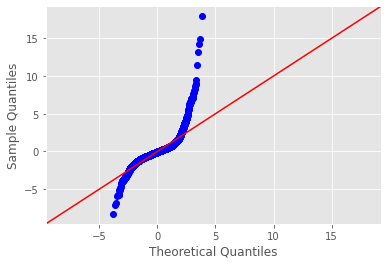

In [36]:
import scipy.stats as stats
residuals = model.resid
fig = sm.graphics.qqplot(residuals, dist=stats.norm, line='45', fit=True)
fig.show()

The regression and qq plots are showing issues with the data, sugessting some data transformations are required to normalise the independent variables. 


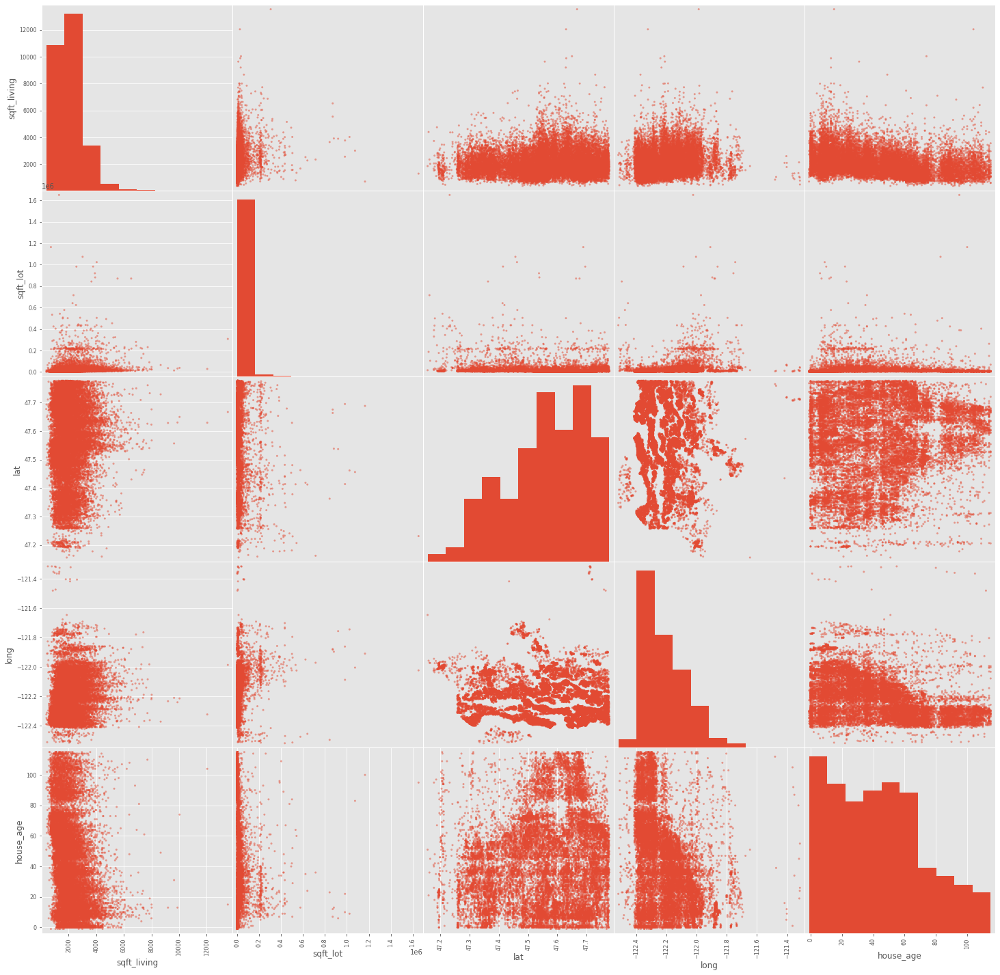

In [40]:
# looking at distribution of data
pd.plotting.scatter_matrix(df.iloc[:,1:], figsize=(25,25));

In [42]:
dfc = df.copy()  # backup copy of dataframe before transformation

In [43]:
# transform variables using log
df['house_age']=df['house_age']+1+1/365 # add a year and day to avoid log(<=0)
df['long']=-df['long']    # invert longitude to avoid log(<=0)
non_normal = ['sqft_living','sqft_lot','lat','long','house_age']
for feat in non_normal:
    df[feat] = df[feat].map(lambda x: np.log(x))
    df[feat] = (df[feat] - np.mean(df[feat])) / np.sqrt(np.var(df[feat]))    # normalise using standardization

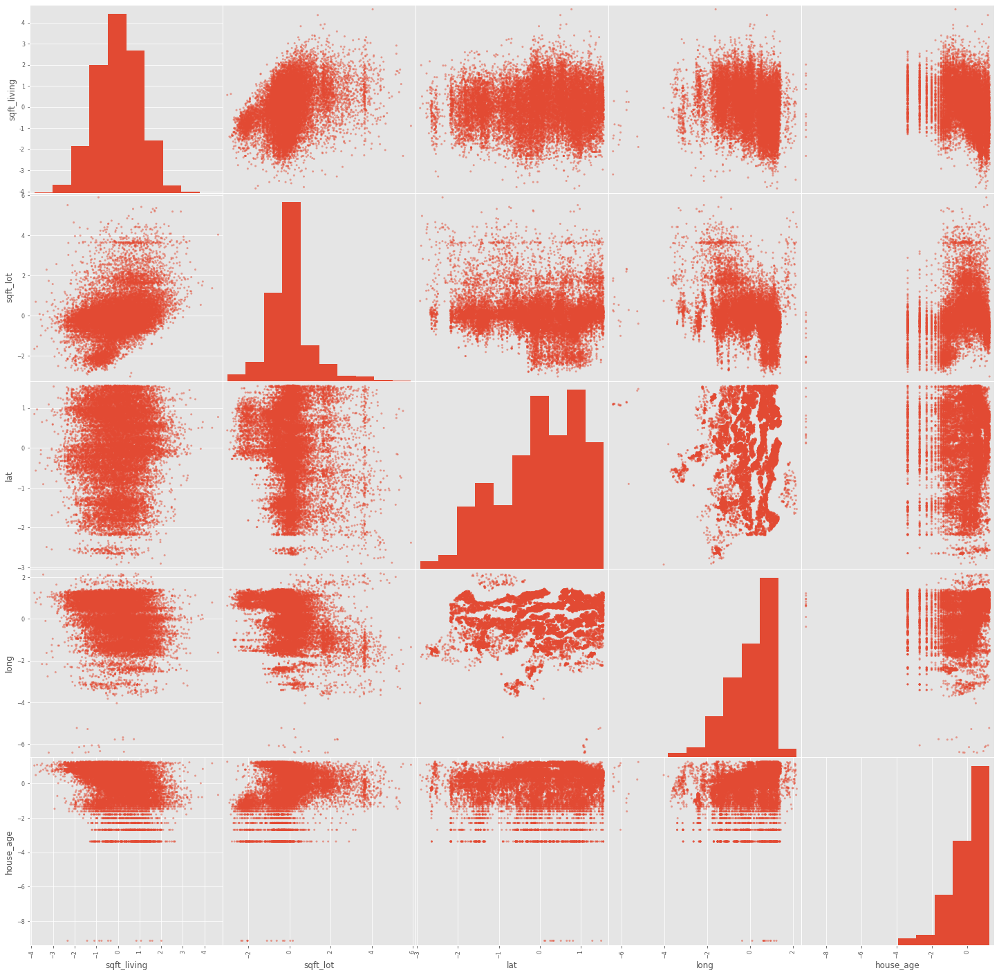

In [44]:
pd.plotting.scatter_matrix(df.iloc[:,1:], figsize=(25,25));

In [45]:
# log good for sqft_living and sqft_lot, but not good for others
reset = ['lat','long','house_age']
for feat in reset:
    df[feat] = dfc[feat].copy()

In [46]:
# try sqrt transform
df['house_age']=df['house_age']+1+1/365 # add a year and day to avoid log(<=0)
df['long']=-df['long']    # invert longitude to avoid log(<0)
non_normal = ['lat','long','house_age']
for feat in non_normal:
    df[feat] = df[feat].map(lambda x: np.sqrt(x))
    df[feat] = (df[feat] - np.mean(df[feat])) / np.sqrt(np.var(df[feat]))    

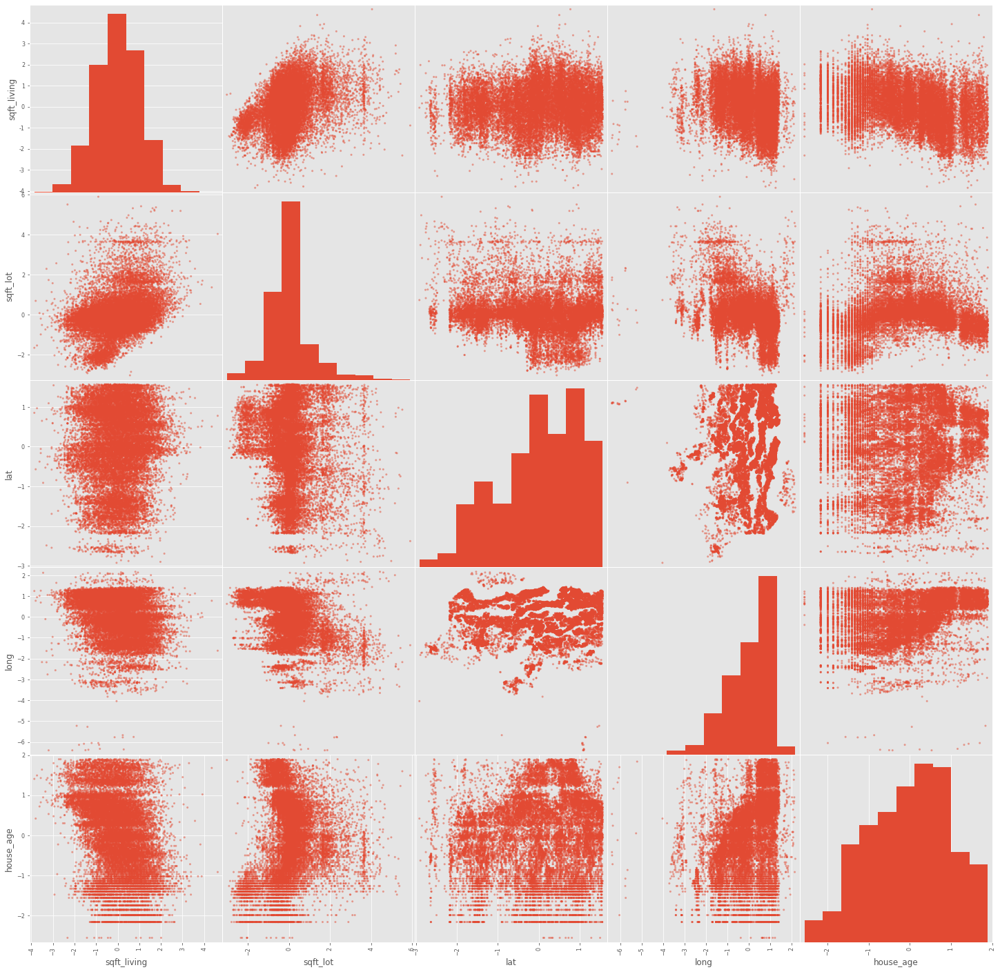

In [47]:
pd.plotting.scatter_matrix(df.iloc[:,1:], figsize=(25,25));

In [48]:
# sqrt ok-ish for house age, but not good for long and lat which are annoyingly resistant to transformation
reset = ['lat','long','house_age']
for feat in reset:
    df[feat] = dfc[feat].copy()

In [49]:
# try inverse transform
df['house_age']=df['house_age']+1+1/365 # add a year and day to avoid log(<=0)
df['long']=-df['long']    # invert longitude to avoid log(<0)
non_normal = ['lat','long','house_age']
for feat in non_normal:
    df[feat] = df[feat].map(lambda x: 1/x)
    df[feat] = (df[feat] - np.mean(df[feat])) / np.sqrt(np.var(df[feat]))    

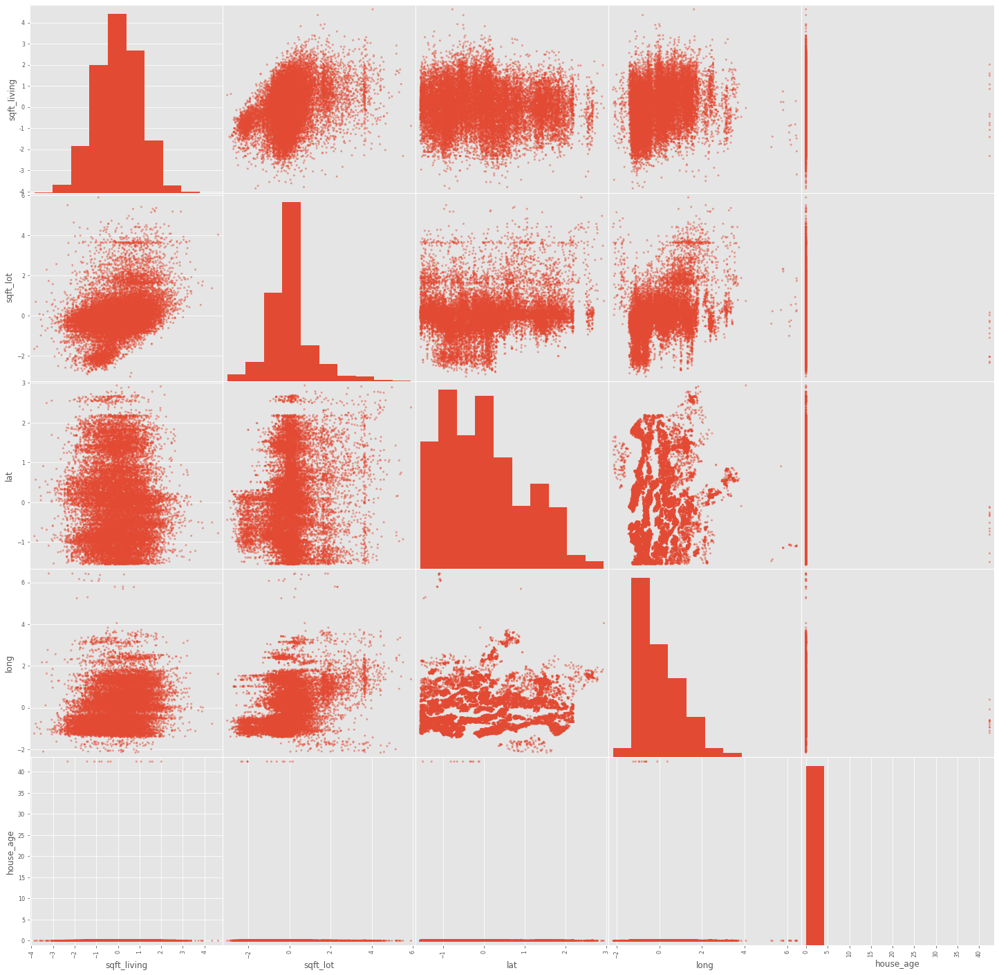

In [50]:
pd.plotting.scatter_matrix(df.iloc[:,1:], figsize=(25,25));

In [52]:
# Not good for house_age, just flips long & lat
reset = ['lat','long','house_age']
for feat in reset:
    df[feat] = dfc[feat].copy()

In [53]:
# try exp transform
df['house_age']=df['house_age']+1+1/365 # add a year and day to avoid log(<=0)
df['long']=-df['long']    # invert longitude to avoid log(<0)
non_normal = ['lat','long','house_age']
for feat in non_normal:
    df[feat] = df[feat].map(lambda x: np.exp(x))
    df[feat] = (df[feat] - np.mean(df[feat])) / np.sqrt(np.var(df[feat]))    

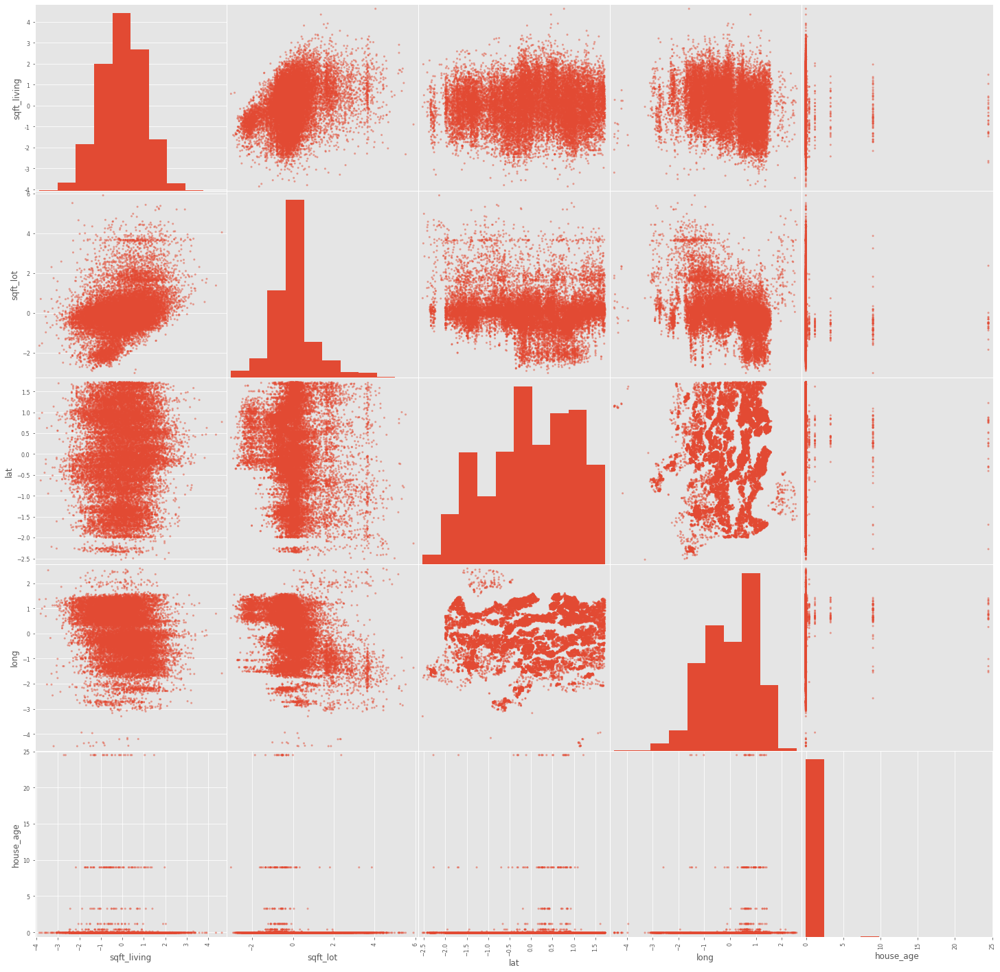

In [54]:
pd.plotting.scatter_matrix(df.iloc[:,1:], figsize=(25,25));

In [55]:
# something finally did something for lat and long, though only a little - use for them
# put house_age back to sqrt as that was best
df['house_age']=dfc['house_age'].copy()+1+1/365 # reset and add a year and day to avoid log(<=0)
df['house_age']=df['house_age']
non_normal = ['house_age']
for feat in non_normal:
    df[feat] = df[feat].map(lambda x: np.sqrt(x))
    df[feat] = (df[feat] - np.mean(df[feat])) / np.sqrt(np.var(df[feat]))  

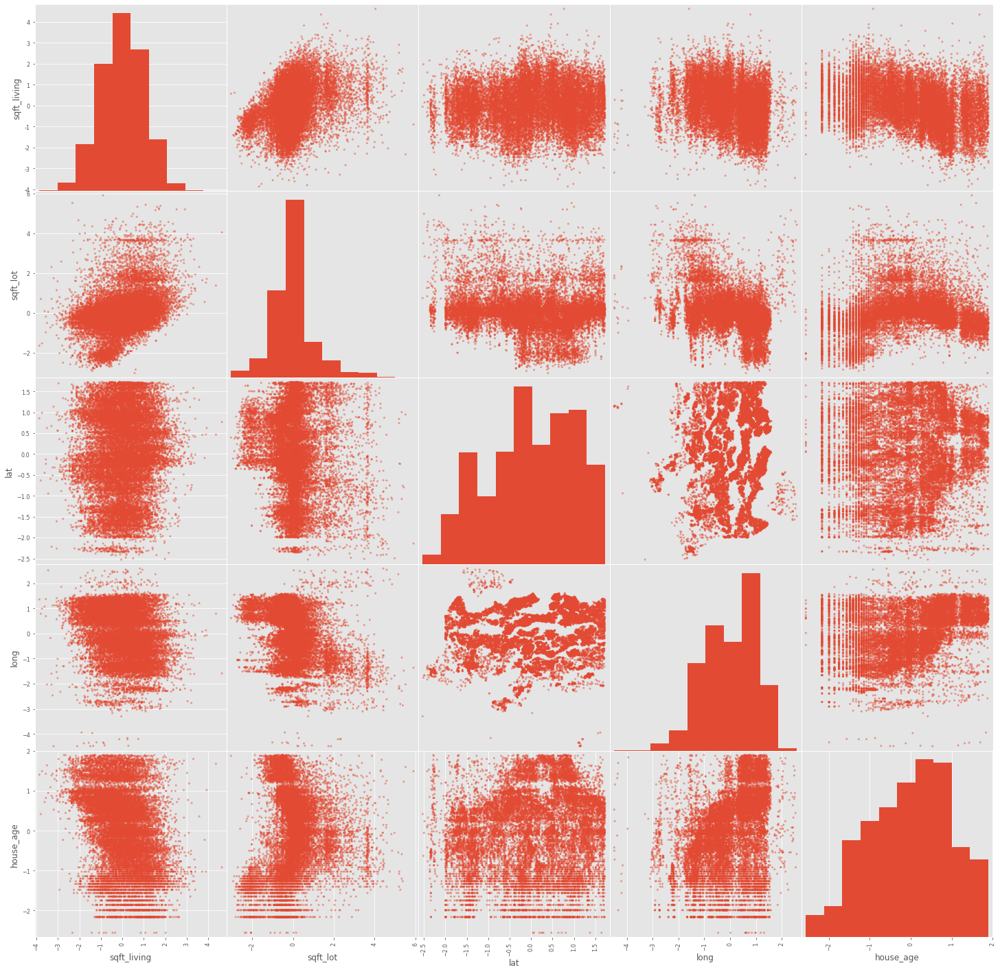

In [56]:
# now have log transformed sqft_living and sqft_lot, exponential transofrmed long/lat and sqrt transformed house_age

pd.plotting.scatter_matrix(df.iloc[:,1:], figsize=(25,25));

#### Iteration 3

In [57]:
outcome = 'price'
predictors = df.drop('price',axis=1)
pred_sum = '+'.join(predictors.columns)
formula = outcome + '~' + pred_sum

model = ols(formula=formula,data=df).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.695
Model:                            OLS   Adj. R-squared:                  0.694
Method:                 Least Squares   F-statistic:                     1495.
Date:                Sat, 23 Sep 2023   Prob (F-statistic):               0.00
Time:                        21:04:16   Log-Likelihood:            -2.1590e+05
No. Observations:               15808   AIC:                         4.319e+05
Df Residuals:                   15783   BIC:                         4.320e+05
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept          8.887e+05   8826.741    100.678      0.000    8.71e+05    9.06e+05
bathrooms[T.4.0]   1.099e+05   8373.464     13.119      0.000    9.34e+04    1.26e+05
bathrooms[T.5.0]   4.263e+05   1.91e+04     22.319      0.000    3.89e+05    4.64e+05
floors[T.1.5]      4392.6538   6338.072      0.693      0.488   -8030.691    1.68e+04
floors[T.2.0]      2033.0852   4866.220      0.418      0.676   -7505.263    1.16e+04
floors[T.2.5]      1.266e+05   1.97e+04      6.441      0.000    8.81e+04    1.65e+05
floors[T.3.0]      2.555e+04   1.18e+04      2.169      0.030    2461.472    4.86e+04
floors[T.3.5]      1.689e+05   8.48e+04      1.992      0.046    2736.594    3.35e+05
waterfront[T.1.0]  8.057e+05   1.93e+04     41.843      0.000    7.68e+05    8.43e+05
grade[T.11]        2.624e+05   1.43e+04     18.301      0.000    2.34e+05    2.91e+05
grade[T.12]        9.097e+05   2.69e+04     33.839      0.000    8.57e+05    9.62e+05
grade[T.13]        2.067e+06   6.38e+04     32.423      0.000    1.94e+06    2.19e+06
grade[T.3]        -1.856e+05   2.07e+05     -0.895      0.371   -5.92e+05    2.21e+05
grade[T.4]        -4.078e+05   5.34e+04     -7.644      0.000   -5.12e+05   -3.03e+05
grade[T.5]        -4.894e+05   1.97e+04    -24.852      0.000   -5.28e+05   -4.51e+05
grade[T.6]        -5.051e+05   1.17e+04    -43.060      0.000   -5.28e+05   -4.82e+05
grade[T.7]         -4.69e+05   9273.822    -50.576      0.000   -4.87e+05   -4.51e+05
grade[T.8]        -3.747e+05   8574.007    -43.703      0.000   -3.92e+05   -3.58e+05
grade[T.9]        -2.055e+05   8777.395    -23.413      0.000   -2.23e+05   -1.88e+05
renovated[T.1.0]    6.78e+04   8669.479      7.820      0.000    5.08e+04    8.48e+04
sqft_living        1.135e+05   2753.814     41.230      0.000    1.08e+05    1.19e+05
sqft_lot           -1.95e+04   2126.045     -9.173      0.000   -2.37e+04   -1.53e+04
lat                7.418e+04   1738.663     42.663      0.000    7.08e+04    7.76e+04
long               8771.8179   2041.797      4.296      0.000    4769.662    1.28e+04
house_age          6.557e+04   2627.533     24.955      0.000    6.04e+04    7.07e+04
==============================================================================
Omnibus:                    11200.722   Durbin-Watson:                   1.974
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           715909.631
Skew:                           2.770   Prob(JB):                         0.00
Kurtosis:                      35.500   Cond. No.                         177.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Model Summary:

- 69.5% of the variability in the price is explained by the independent variables.
- high F-statistic suggests a better fit.
- the model is statistically significant.
- Omnibus test suggests that the residuals may not be normally distributed.
- Durbin-Watson test indicates no significant autocorrelation.
- Jarque-Bera test suggests non-normality.
- a positive Skew
- high kurtosis indicates heavy tails or outliers in the distribution of residuals.
- Cond. No.is much less

In this iteration, the regression model appears to explain a significant portion of the variability in house prices, with several independent variables showing statistically significant relationships with the dependent variable (price). However, it's important to further investigate the assumptions of the regression model, such as normality of residuals, to ensure the validity of the results. Additionally, the high skewness and kurtosis values suggest that the residuals may not be normally distributed, which could be a concern.

#### Visualize error terms


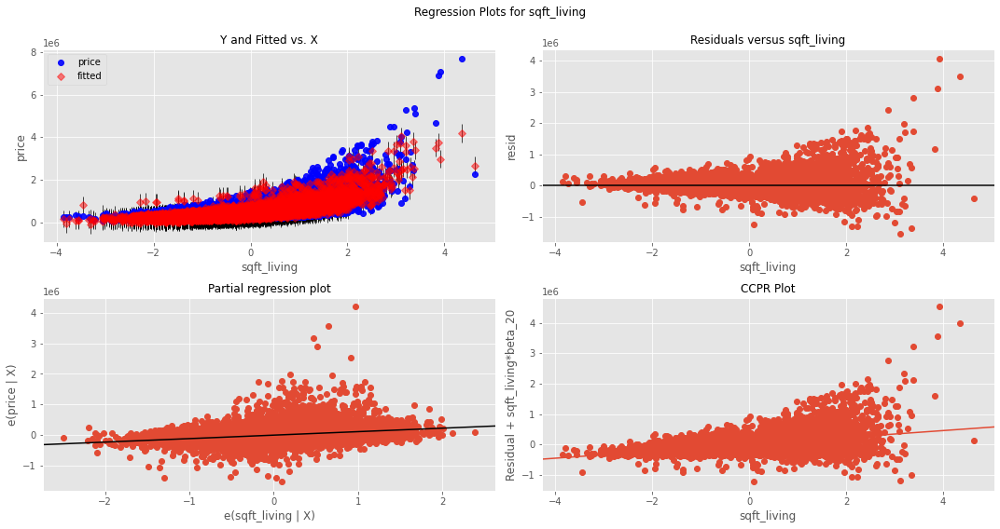

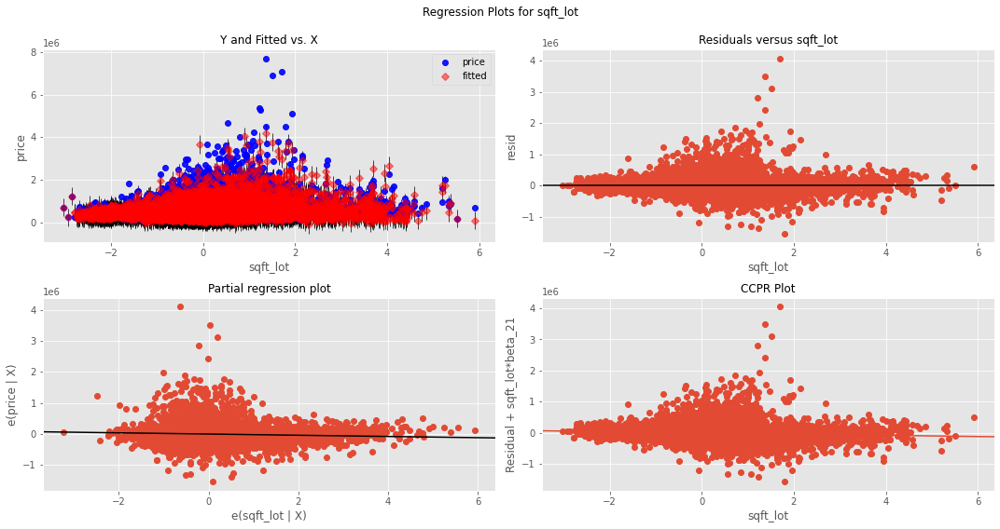

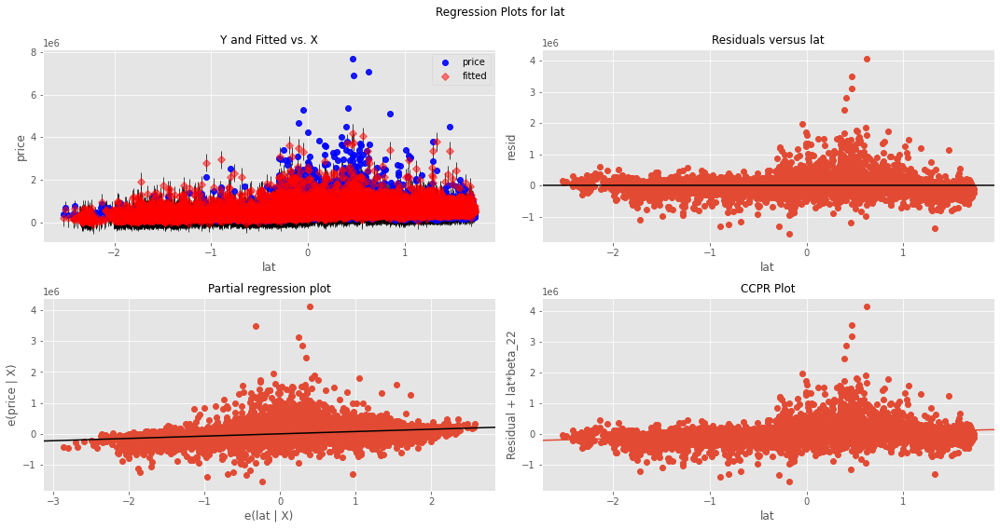

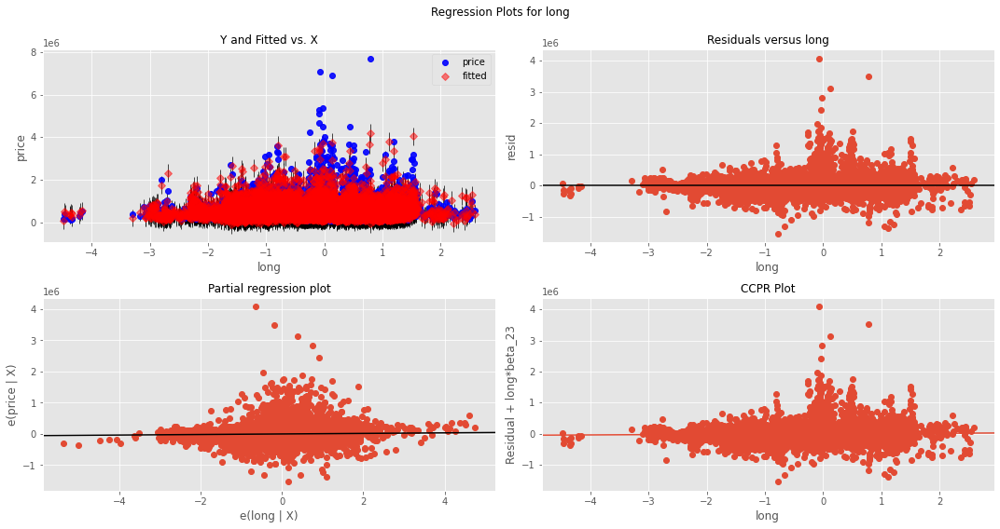

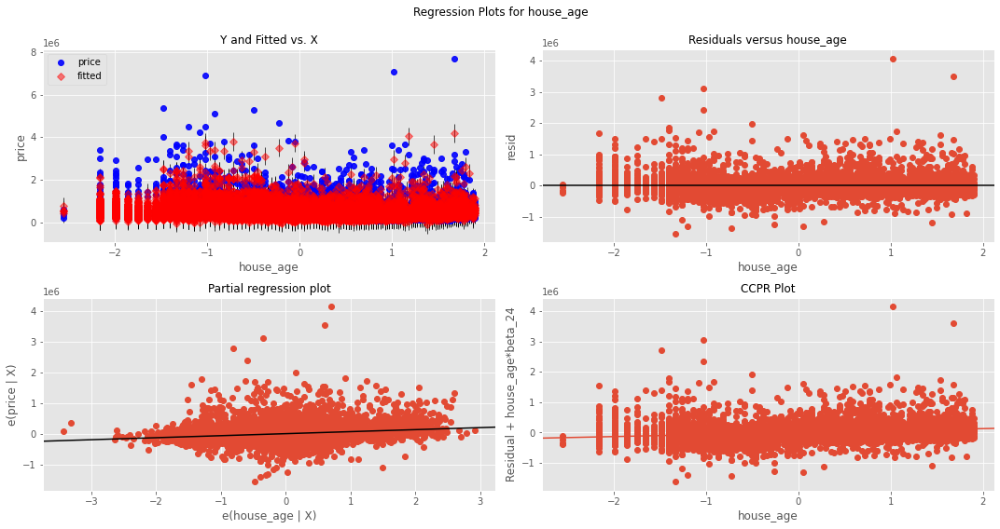

In [59]:
# List of predictor variables for which you want to create diagnostic plots
predictor_variables = ["sqft_living", "sqft_lot", "lat", "long", "house_age"]

# Create a loop to generate diagnostic plots for each predictor
for predictor in predictor_variables:
    try:
        fig = plt.figure(figsize=(15, 8))
        fig = sm.graphics.plot_regress_exog(model, predictor, fig=fig)
        plt.show()
    except ValueError:
        print(f"'{predictor}' is not in the list of DataFrame columns.")


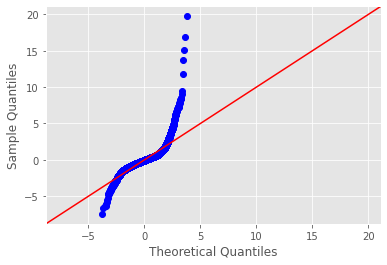

In [65]:
import scipy.stats as stats
residuals = model.resid
fig = sm.graphics.qqplot(residuals, dist=stats.norm, line='45', fit=True)

The regression and qq plots are showing issues with the data, like heteroscedasticity, sugessting more data transformations are required to normalise the independent variables. 


#### Iteration 4

In [67]:
# model still not normal residuals, try log transform of price (the target)
df['price'] = df['price'].map(lambda x: np.log(x))

# re-run model
outcome = 'price'
predictors = df.drop('price',axis=1)
pred_sum = '+'.join(predictors.columns)
formula = outcome + '~' + pred_sum

model = ols(formula=formula,data=df).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.738
Model:                            OLS   Adj. R-squared:                  0.738
Method:                 Least Squares   F-statistic:                     1853.
Date:                Sat, 23 Sep 2023   Prob (F-statistic):               0.00
Time:                        21:11:25   Log-Likelihood:                -1701.4
No. Observations:               15808   AIC:                             3453.
Df Residuals:                   15783   BIC:                             3644.
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept            13.4807      0.012   1171.272      0.000      13.458      13.503
bathrooms[T.4.0]      0.1109      0.011     10.160      0.000       0.090       0.132
bathrooms[T.5.0]      0.1615      0.025      6.485      0.000       0.113       0.210
floors[T.1.5]         0.0526      0.008      6.363      0.000       0.036       0.069
floors[T.2.0]         0.0346      0.006      5.451      0.000       0.022       0.047
floors[T.2.5]         0.0925      0.026      3.610      0.000       0.042       0.143
floors[T.3.0]         0.0782      0.015      5.088      0.000       0.048       0.108
floors[T.3.5]         0.1137      0.111      1.028      0.304      -0.103       0.330
waterfront[T.1.0]     0.6502      0.025     25.896      0.000       0.601       0.699
grade[T.11]           0.1597      0.019      8.542      0.000       0.123       0.196
grade[T.12]           0.4126      0.035     11.772      0.000       0.344       0.481
grade[T.13]           0.6946      0.083      8.355      0.000       0.532       0.858
grade[T.3]           -0.1334      0.270     -0.493      0.622      -0.664       0.397
grade[T.4]           -0.8398      0.070    -12.072      0.000      -0.976      -0.703
grade[T.5]           -0.8421      0.026    -32.799      0.000      -0.892      -0.792
grade[T.6]           -0.7662      0.015    -50.090      0.000      -0.796      -0.736
grade[T.7]           -0.6115      0.012    -50.565      0.000      -0.635      -0.588
grade[T.8]           -0.4078      0.011    -36.478      0.000      -0.430      -0.386
grade[T.9]           -0.1734      0.011    -15.147      0.000      -0.196      -0.151
renovated[T.1.0]      0.0717      0.011      6.341      0.000       0.050       0.094
sqft_living           0.1984      0.004     55.251      0.000       0.191       0.205
sqft_lot             -0.0217      0.003     -7.817      0.000      -0.027      -0.016
lat                   0.1789      0.002     78.909      0.000       0.174       0.183
long                  0.0003      0.003      0.097      0.923      -0.005       0.005
house_age             0.1020      0.003     29.766      0.000       0.095       0.109
==============================================================================
Omnibus:                      217.261   Durbin-Watson:                   1.983
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              371.690
Skew:                           0.096   Prob(JB):                     1.94e-81
Kurtosis:                       3.726   Cond. No.                         177.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Model Summary:

- 73.8% of the variance in house prices is explained by the independent variables 
- the overall model is statistically significant.
- Omnibus test suggests that the residuals may not be normally distributed.
- Durbin-Watson test indicates no significant autocorrelation.
- Jarque-Bera test suggests non-normality.
- the skewness is 0.096, suggesting that the residuals are approximately symmetrically distributed.
- kurtosis is 3.726, suggesting that the distribution of residuals has slightly heavier tails than a normal distribution, but it's not highly pronounced.
- Cond. No. is not extremely high, so multicollinearity may not be a significant issue.

In this iteration, the regression model appears to explain a significant portion of the variability in house prices, with several independent variables showing statistically significant relationships with the dependent variable (price).The skewness and kurtosis values suggest that the residuals are approximately symmetric with slightly heavier tails than a normal distribution. The condition number suggests that multicollinearity is not a major concern. 
However, it's important to further investigate normality of residuals, to ensure the validity of the results. 

#### Visualize error terms


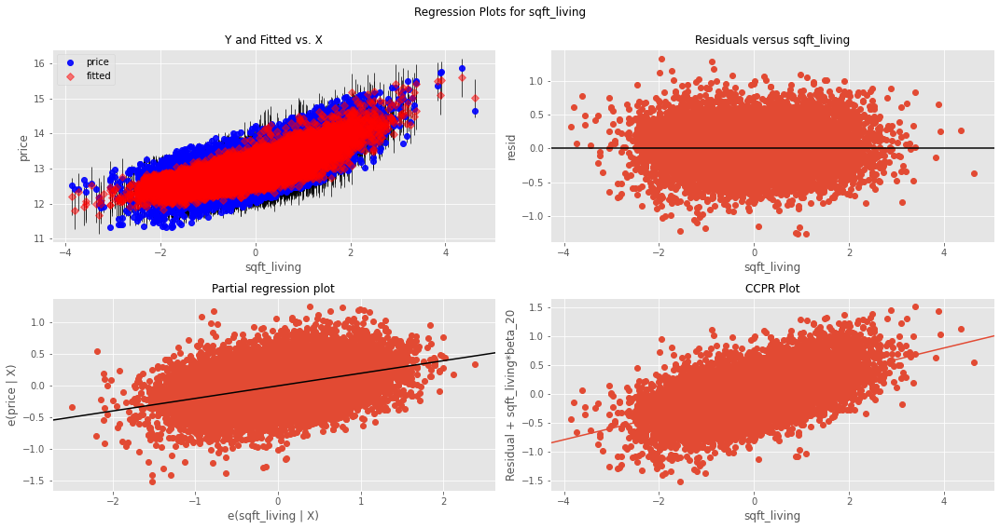

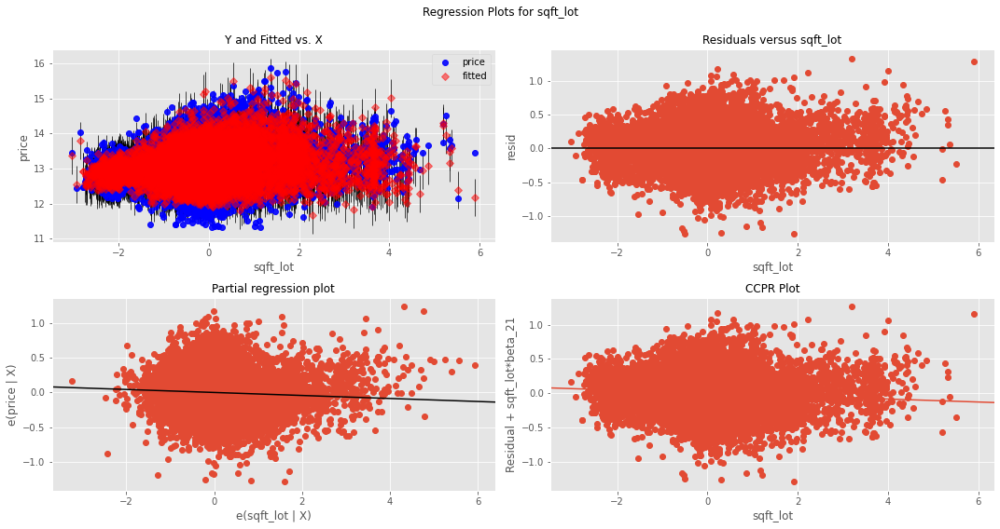

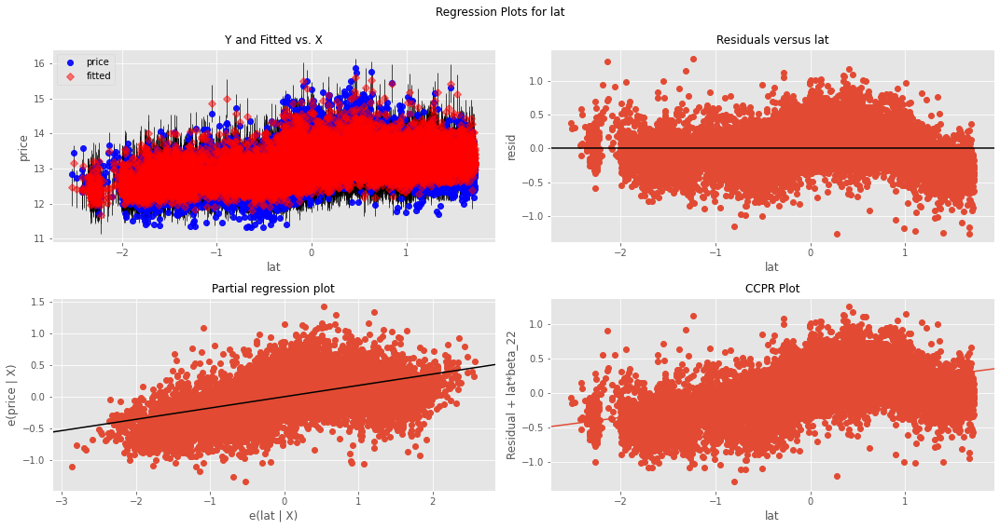

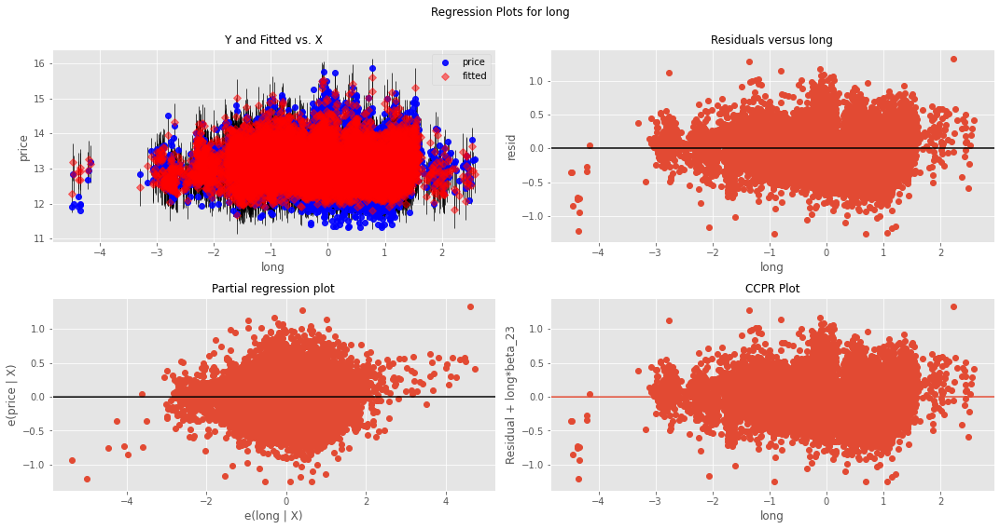

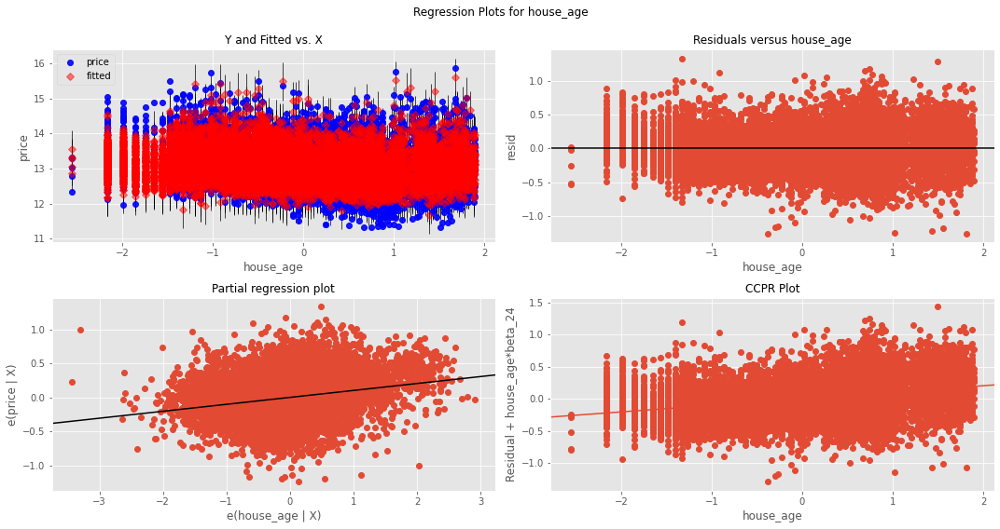

In [68]:
# List of predictor variables for which you want to create diagnostic plots
predictor_variables = ["sqft_living", "sqft_lot", "lat", "long", "house_age"]

# Create a loop to generate diagnostic plots for each predictor
for predictor in predictor_variables:
    try:
        fig = plt.figure(figsize=(15, 8))
        fig = sm.graphics.plot_regress_exog(model, predictor, fig=fig)
        plt.show()
    except ValueError:
        print(f"'{predictor}' is not in the list of DataFrame columns.")


Data's looking much better, more homoscedastic.

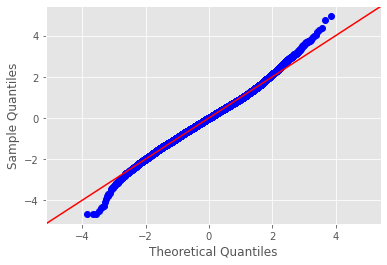

In [70]:
import scipy.stats as stats
residuals = model.resid
fig = sm.graphics.qqplot(residuals, dist=stats.norm, line='45', fit=True)

While residuals are not normal, the QQ plot aligns well between -2 to 2 and slightly deviates either side.
This suggests the model could good for prediction, despite residuals not being normal.

Model almost ready for train-test testing. Just tidy some loose ends based on last model coefficients and p-values

floors=3.5 and grade=3 not significant

In [89]:
# check how many data points are 3.5 floors
dfc[dfc['floors']=='3.5']

,price,bathrooms,sqft_living,sqft_lot,floors,waterfront,grade,lat,long,house_age,renovated
10066,435000.0,3.0,1440,1350,3.5,0.0,8,47.6525,-122.345,9,0.0
11582,544000.0,3.0,1760,1755,3.5,0.0,8,47.6688,-122.279,17,0.0
14871,525000.0,3.0,1730,1074,3.5,0.0,8,47.6692,-122.392,9,0.0
15410,479000.0,3.0,1730,1037,3.5,0.0,8,47.5594,-122.285,7,0.0
18462,3300000.0,4.0,7710,11750,3.5,0.0,12,47.6263,-122.314,110,0.0
20292,525000.0,3.0,1310,1268,3.5,0.0,8,47.6534,-122.355,7,0.0
20756,563500.0,3.0,1400,1312,3.5,nan,8,47.6534,-122.355,7,nan


In [87]:
# check how many data points are grade 3
dfc[dfc['grade']=='3']

,price,bathrooms,sqft_living,sqft_lot,floors,waterfront,grade,lat,long,house_age,renovated
3220,262000.0,3.0,520,12981,1.0,0.0,3,47.2082,-121.995,95,0.0


In [84]:
# only 7 data points were 3.5 floors and only 1 was grade=3
# remove that data because insignificant
df = df[df['floors'] != '3.5']
df = df[df['grade'] != '3']

In [90]:
# long is no longer significant - drop
# sqft_lot coefficient is very small (-0.0217), very little influence so remove for simplicity
df.drop(columns=['long','sqft_lot'], inplace=True)

#### Iteration 5 - Final model

In [91]:
# re-run model
outcome = 'price'
predictors = df.drop('price',axis=1)
pred_sum = '+'.join(predictors.columns)
formula = outcome + '~' + pred_sum

model = ols(formula=formula,data=df).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.737
Model:                            OLS   Adj. R-squared:                  0.736
Method:                 Least Squares   F-statistic:                     2207.
Date:                Sat, 23 Sep 2023   Prob (F-statistic):               0.00
Time:                        21:43:56   Log-Likelihood:                -1740.0
No. Observations:               15801   AIC:                             3522.
Df Residuals:                   15780   BIC:                             3683.
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept            13.4650      0.011   1183.264      0.000      13.443      13.487
bathrooms[T.4.0]      0.1161      0.011     10.653      0.000       0.095       0.138
bathrooms[T.5.0]      0.1653      0.025      6.624      0.000       0.116       0.214
floors[T.1.5]         0.0616      0.008      7.495      0.000       0.045       0.078
floors[T.2.0]         0.0476      0.006      7.734      0.000       0.036       0.060
floors[T.2.5]         0.1168      0.026      4.576      0.000       0.067       0.167
floors[T.3.0]         0.1146      0.015      7.795      0.000       0.086       0.143
waterfront[T.1.0]     0.6419      0.025     25.596      0.000       0.593       0.691
grade[T.11]           0.1560      0.019      8.326      0.000       0.119       0.193
grade[T.12]           0.4022      0.035     11.391      0.000       0.333       0.471
grade[T.13]           0.6970      0.083      8.366      0.000       0.534       0.860
grade[T.4]           -0.8561      0.070    -12.285      0.000      -0.993      -0.720
grade[T.5]           -0.8469      0.026    -33.022      0.000      -0.897      -0.797
grade[T.6]           -0.7611      0.015    -49.739      0.000      -0.791      -0.731
grade[T.7]           -0.6014      0.012    -49.890      0.000      -0.625      -0.578
grade[T.8]           -0.3970      0.011    -35.661      0.000      -0.419      -0.375
grade[T.9]           -0.1671      0.011    -14.596      0.000      -0.190      -0.145
renovated[T.1.0]      0.0735      0.011      6.488      0.000       0.051       0.096
sqft_living           0.1887      0.003     55.330      0.000       0.182       0.195
lat                   0.1819      0.002     80.986      0.000       0.177       0.186
house_age             0.1004      0.003     31.202      0.000       0.094       0.107
==============================================================================
Omnibus:                      187.831   Durbin-Watson:                   1.981
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              318.456
Skew:                           0.069   Prob(JB):                     7.05e-70
Kurtosis:                       3.682   Cond. No.                         49.0
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Model Summary:

- 73.7% of the variance in house prices is explained by the independent variables 
- the overall model is statistically significant.
- Omnibus test suggests that the residuals may not be normally distributed.
- Durbin-Watson test indicates no significant autocorrelation.
- Jarque-Bera test suggests non-normality.
- the skewness is 0.069, suggesting that the residuals are approximately symmetrically distributed.
- kurtosis is 3.682, suggesting that the distribution of residuals has slightly heavier tails than a normal distribution, but it's not highly pronounced.
- Cond. No. is not extremely high, so multicollinearity is not a significant issue.


#### Visualize error terms


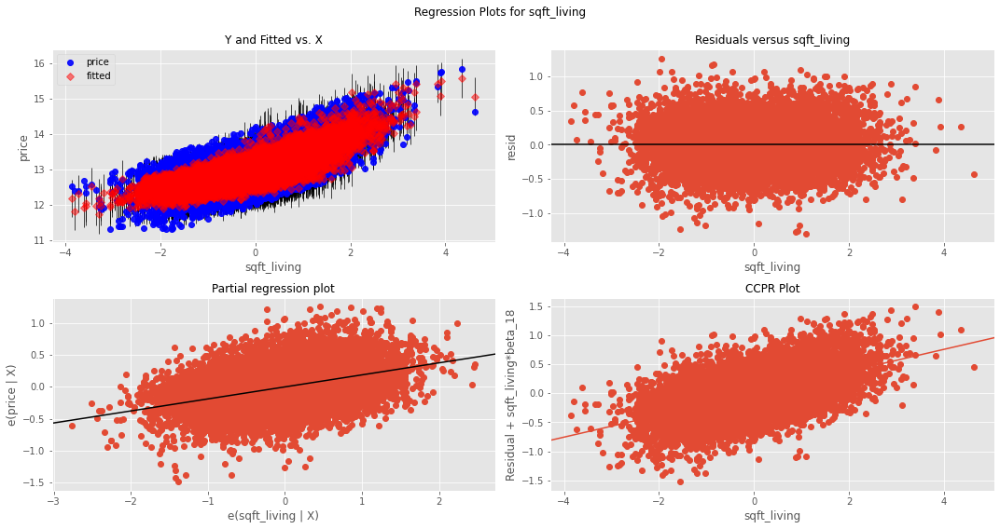

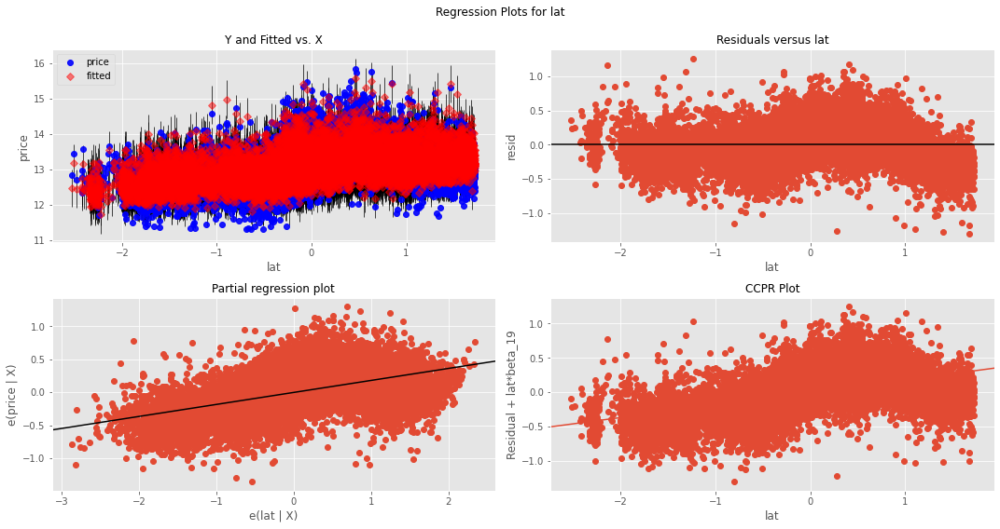

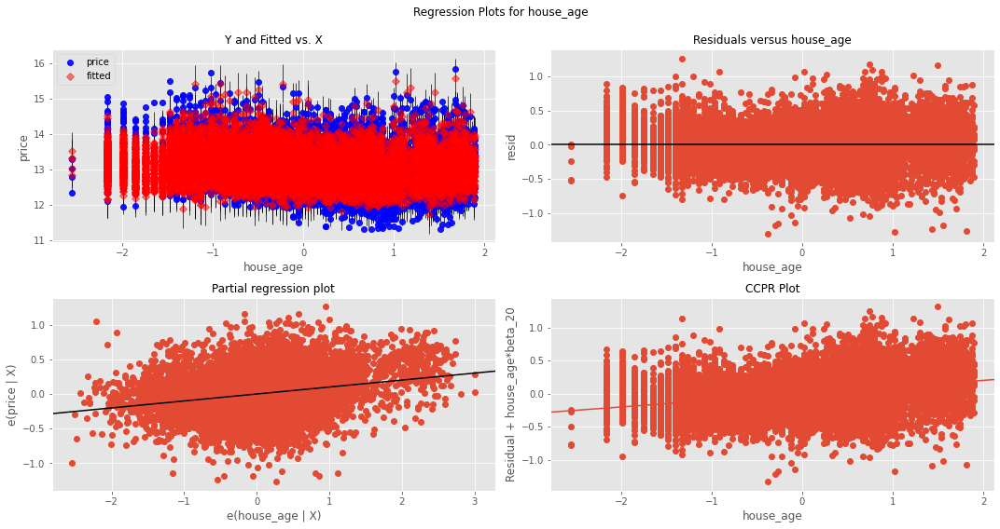

In [92]:
# List of predictor variables for which you want to create diagnostic plots
predictor_variables = ["sqft_living", "lat", "house_age"]

# Create a loop to generate diagnostic plots for each predictor
for predictor in predictor_variables:
    try:
        fig = plt.figure(figsize=(15, 8))
        fig = sm.graphics.plot_regress_exog(model, predictor, fig=fig)
        plt.show()
    except ValueError:
        print(f"'{predictor}' is not in the list of DataFrame columns.")


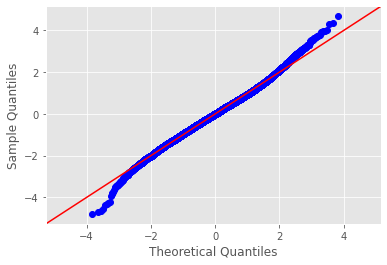

In [93]:
import scipy.stats as stats
residuals = model.resid
fig = sm.graphics.qqplot(residuals, dist=stats.norm, line='45', fit=True)

Everything with this model is a little better. Still not normal residuals, but the best model and worth trying for prediction based on QQ plot.

This is the final model!

#### Train-Test Split

In [94]:
# Previously statsmodels.formula.api OLS was used for linear regression
# this automatically removes NaN, so they were left in the dataset.
# The sklearn.linear_model LinearRegression doesn't like NaN
# So remove all rows with at least one NaN

# make dfn a NaN free version of the dataframe
dfn = df.copy()

# waterfront and renovated have NaN but are str. Convert to float, remove NaN, then convert back
dfn['waterfront'] = dfn['waterfront'].astype(float)
dfn['renovated'] = dfn['renovated'].astype(float)
dfn = dfn.dropna()
dfn['waterfront'] = dfn['waterfront'].astype(str)
dfn['renovated'] = dfn['renovated'].astype(str)


In [107]:
# split the data into train and test using default 75-25 split
from sklearn.model_selection import train_test_split

X = dfn.drop("price", axis=1)
y = dfn["price"]

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=1)

In [108]:
# Linear regression
from sklearn.linear_model import LinearRegression
linreg = LinearRegression()

In [109]:
linreg.fit(X_train, y_train)


LinearRegression()

In [110]:
# Generated Predictions on Training and Test Sets
y_hat_train = linreg.predict(X_train)
y_hat_test = linreg.predict(X_test)

In [111]:
# Calculate the Mean Squared Error (MSE)
from sklearn.metrics import mean_squared_error, r2_score

train_mse = mean_squared_error(y_train, y_hat_train)
test_mse = mean_squared_error(y_test, y_hat_test)
print('Train Mean Squared Error:', train_mse)
print('Test Mean Squared Error: ', test_mse)

train_r_squared = r2_score(y_train, y_hat_train)
test_r_squared = r2_score(y_test, y_hat_test)
print('Train R^2:', train_r_squared)
print('Test R^2: ', test_r_squared)

Train Mean Squared Error: 0.07331123858357216
Test Mean Squared Error:  0.07472035128667313
Train R^2: 0.7341765868521248
Test R^2:  0.7341868301756703


The results indicate that the regression model performs reasonably well. The Train and Test MSE values are close, suggesting that the model does not suffer from significant overfitting. Additionally, the R^2 values for both the training and test datasets are relatively high, indicating that the model explains a substantial portion of the variance in house prices. 

In [112]:
# original scale (undo log transformation)
y_train = np.exp(y_train)
y_test = np.exp(y_test)
y_hat_train = np.exp(y_hat_train)
y_hat_test = np.exp(y_hat_test)

train_mse = mean_squared_error(y_train, y_hat_train)
test_mse = mean_squared_error(y_test, y_hat_test)
print('Train Mean Squared Error:', train_mse)
print('Test Mean Squared Error: ', test_mse)

train_r_squared = r2_score(y_train, y_hat_train)
test_r_squared = r2_score(y_test, y_hat_test)
print('Train R^2:', train_r_squared)
print('Test R^2: ', test_r_squared)



Train Mean Squared Error: 38379814955.59602
Test Mean Squared Error:  42843829389.96925
Train R^2: 0.7159106495067213
Test R^2:  0.7186610996347547
